# Our stakeholder is a marketing company looking to target a segment of customers with high incomes (>50_000$/Y). Our task is to develop a model that categorizes individuals into two groups (high income and low income). The stakeholder has provided us with a dataset, and our focus will be exclusively on data from  USA customers.

# imports and functions

In [1746]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# Preprocessing tools
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

# Models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

# Setting options
n=800
pd.set_option('display.max_columns',n)
pd.set_option("display.max_info_rows", n)
pd.set_option('display.max_info_columns',n)
from sklearn import set_config
set_config(transform_output='pandas')

from sklearn.pipeline import Pipeline, make_pipeline

from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector

SEED = 42
np.random.seed(SEED)
from sklearn.preprocessing import OneHotEncoder

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.metrics import f1_score, recall_score, accuracy_score, precision_score
from sklearn.metrics import confusion_matrix

from sklearn.inspection import permutation_importance

from sklearn.preprocessing import StandardScaler,OrdinalEncoder
from sklearn.decomposition import PCA

In [1747]:
from sklearn.metrics import ConfusionMatrixDisplay, classification_report
def classification_metrics(y_true, y_pred, label="",
                           output_dict=False, figsize=(8,4),
                           normalize='true', cmap='Blues',
                           colorbar=False):
  # Get the classification report
  report = classification_report(y_true, y_pred)
  ## Print header and report
  header = "-"*70
  print(header, f" Classification Metrics: {label}", header, sep='\n')
  print(report)
  ## CONFUSION MATRICES SUBPLOTS
  fig, axes = plt.subplots(ncols=2, figsize=figsize)
  # create a confusion matrix  of raw counts
  ConfusionMatrixDisplay.from_predictions(y_true, y_pred,
                normalize=None, cmap='gist_gray', colorbar=colorbar,
                ax = axes[0],);
  axes[0].set_title("Raw Counts")
  # create a confusion matrix with the test data
  ConfusionMatrixDisplay.from_predictions(y_true, y_pred,
                normalize=normalize, cmap=cmap, colorbar=colorbar,
                ax = axes[1]);
  axes[1].set_title("Normalized Confusion Matrix")
  # Adjust layout and show figure
  fig.tight_layout()
  plt.show()
  # Return dictionary of classification_report
  if output_dict==True:
    report_dict = classification_report(y_true, y_pred, output_dict=True)
    return report_dict



def evaluate_classification(model, X_train, y_train, X_test, y_test,
                         figsize=(6,4), normalize='true', output_dict = False,
                            cmap_train='Blues', cmap_test="Reds",colorbar=False):
  # Get predictions for training data
  y_train_pred = model.predict(X_train)
  # Call the helper function to obtain regression metrics for training data
  results_train = classification_metrics(y_train, y_train_pred, #verbose = verbose,
                                     output_dict=True, figsize=figsize,
                                         colorbar=colorbar, cmap=cmap_train,
                                     label='Training Data')
  print()
  # Get predictions for test data
  y_test_pred = model.predict(X_test)
  # Call the helper function to obtain regression metrics for test data
  results_test = classification_metrics(y_test, y_test_pred, #verbose = verbose,
                                  output_dict=True,figsize=figsize,
                                         colorbar=colorbar, cmap=cmap_test,
                                    label='Test Data' )
  if output_dict == True:
    # Store results in a dataframe if ouput_frame is True
    results_dict = {'train':results_train,
                    'test': results_test}
    return results_dict

In [1748]:
def plot_importance(importances, top_n=None,  figsize=(8,6)):
    # sorting with asc=false for correct order of bars
    if top_n==None:
        ## sort all features and set title
        plot_vals = importances.sort_values()
        title = "All Features - Ranked by Importance"
    else:
        ## sort features and keep top_n and set title
        plot_vals = importances.sort_values().tail(top_n)
        title = f"Top {top_n} Most Important Features"
    ## plotting top N importances
    ax = plot_vals.plot(kind='barh', figsize=figsize)
    ax.set(xlabel='Importance',
            ylabel='Feature Names',
            title=title)
    ## return ax in case want to continue to update/modify figure
    return ax

In [1749]:
def get_color_dict(importances, color_rest='#006ba4' , color_top='green',
                    top_n=7):
    ## color -coding top 5 bars
    highlight_feats = importances.sort_values(ascending=True).tail(top_n).index
    colors_dict = {col: color_top if col in highlight_feats else color_rest for col in importances.index}
    return colors_dict

def plot_importance_color(importances, top_n=None,  figsize=(8,6),
                          color_dict=None):

    # sorting with asc=false for correct order of bars
    if top_n==None:
        ## sort all features and set title
        plot_vals = importances.sort_values()
        title = "All Features - Ranked by Importance"
    else:
        ## sort features and keep top_n and set title
        plot_vals = importances.sort_values().tail(top_n)
        title = f"Top {top_n} Most Important Features"
    ## create plot with colors, if provided
    if color_dict is not None:
        ## Getting color list and saving to plot_kws
        colors = plot_vals.index.map(color_dict)
        ax = plot_vals.plot(kind='barh', figsize=figsize, color=colors)

    else:
        ## create plot without colors, if not provided
        ax = plot_vals.plot(kind='barh', figsize=figsize)

    # set titles and axis labels
    ax.set(xlabel='Importance',
           ylabel='Feature Names',
           title=title)

    ## return ax in case want to continue to update/modify figure
    return ax

In [1750]:
def summarize_df(df_):
    df = df_.copy()
    report = pd.DataFrame({
                        'dtype':df.dtypes,
                        '# null': df.isna().sum(),
                        'null (%)': df.isna().sum()/len(df)*100,
                        'nunique':df.nunique(),
                        "min":df.min(),
                        'max':df.max()
             })
    report.index.name='Column'
    return report.reset_index()
# summarize_df(df)



In [1751]:
# Updating function
def plot_categorical_vs_target(df, x, y, figsize=(6,4),
                            fillna = True, placeholder = 'MISSING',
                            order = None, target_type='reg'):
  # Make a copy of the dataframe and fillna
  temp_df = df.copy()
  # fillna with placeholder
  if fillna == True:
    temp_df[x] = temp_df[x].fillna(placeholder)
  # or drop nulls prevent unwanted 'nan' group in stripplot
  else:
    temp_df = temp_df.dropna(subset=[x])
  # Create the figure and subplots
  fig, ax = plt.subplots(figsize=figsize)
  # REGRESSION-TARGET PLOT
  if target_type=='reg': #Added if statement here
    # Barplot
    sns.barplot(data=temp_df, x=x, y=y, ax=ax, order=order, alpha=0.6,
                linewidth=1, edgecolor='black', errorbar=None)
    # Boxplot
    sns.stripplot(data=temp_df, x=x, y=y, hue=x, ax=ax,
                  order=order, hue_order=order, legend=False,
                  edgecolor='white', linewidth=0.5,
                  size=3,zorder=0)
  # CLASSIFICATION-TARGET PLOT # This is the new code for the classification task
  elif target_type=='class':
    ax = sns.histplot(data=temp_df, hue=y, x=x, stat='percent',  multiple='fill')
  # Rotate xlabels
  ax.set_xticks(ax.get_xticks()) # Added this to prevent a bug
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
  # Add a title
  ax.set_title(f"{x} vs. {y}")
  fig.tight_layout()
  return fig, ax


# =================================================================================================

# Updating the function
def plot_numeric_vs_target(df, x, y, figsize=(6,4),
                           target_type='reg', estimator='mean',
                           errorbar='ci',sorted=False,ascending=False,
                           **kwargs): # kwargs for sns.regplot

  nulls = df[[x,y]].isna().sum()
  if nulls.sum()>0:
    print(f"- Excluding {nulls.sum()} NaN's")
    # print(nulls)
    temp_df = df.dropna(subset=[x,y,])
  else:
    temp_df = df
  # Create the figure
  fig, ax = plt.subplots(figsize=figsize)

  # REGRESSION-TARGET PLOT
  if 'reg' in target_type:
    # Calculate the correlation
    corr = df[[x,y]].corr().round(2)
    r = corr.loc[x,y]
    # Plot the data
    scatter_kws={'ec':'white','lw':1,'alpha':0.8}
    sns.regplot(data=temp_df, x=x, y=y, ax=ax, scatter_kws=scatter_kws, **kwargs) # Included the new argument within the sns.regplot function
    ## Add the title with the correlation
    ax.set_title(f"{x} vs. {y} (r = {r})")

  # CLASSIFICATION-TARGET PLOT
  elif 'class' in target_type:

    # Sort the groups by median/mean
    if sorted == True:

      if estimator == 'median':
        group_vals = temp_df.groupby(y)[x].median()
      elif estimator =='mean':
        group_vals = temp_df.groupby(y)[x].mean()

      ## Sort values
      group_vals = group_vals.sort_values(ascending=ascending)
      order = group_vals.index

    else:
      # Set order to None if not calcualted
      order = None


    # Left Subplot (barplot)
    sns.barplot(data=temp_df, x=y, y=x, order=order,  estimator=estimator,
                errorbar=errorbar, ax=ax, **kwargs)

    # Add title
    ax.set_title(f"{x} vs. {y}")

    # rotate xaxis labels
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


  # Final Adjustments & return
  fig.tight_layout()
  fig.show()
  return fig, ax


"""UNIVARIATE PLOTTING FUNCTIONS FOR EDA"""
# Add the print statements to the function
def explore_categorical(df, x, fillna = True, placeholder = 'MISSING',
                        figsize = (6,4), order = None):
  """Creates a seaborn countplot with the option to temporarily fill missing values
  Prints statements about null values, cardinality, and checks for
  constant/quasi-constant features.
  Source:{PASTE IN FINAL LESSON LINK}
  """
  # Make a copy of the dataframe and fillna
  temp_df = df.copy()
  # Before filling nulls, save null value counts and percent for printing
  null_count = temp_df[x].isna().sum()
  null_perc = null_count/len(temp_df)* 100
  # fillna with placeholder
  if fillna == True:
    temp_df[x] = temp_df[x].fillna(placeholder)
  # Create figure with desired figsize
  fig, ax = plt.subplots(figsize=figsize)
  # Plotting a count plot
  sns.countplot(data=temp_df, x=x, ax=ax, order=order)
  # Rotate Tick Labels for long names
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
  # Add a title with the feature name included
  ax.set_title(f"Column: {x}", fontweight='bold')

  # Fix layout and show plot (before print statements)
  fig.tight_layout()
  plt.show()

  # Print null value info
  print(f"- NaN's Found: {null_count} ({round(null_perc,2)}%)")
  # Print cardinality info
  nunique = temp_df[x].nunique()
  print(f"- Unique Values: {nunique}")
  # First find value counts of feature
  val_counts = temp_df[x].value_counts(dropna=False)
  # Define the most common value
  most_common_val = val_counts.index[0]
  # Define the frequency of the most common value
  freq = val_counts.values[0]
  # Calculate the percentage of the most common value
  perc_most_common = freq / len(temp_df) * 100
  # Print the results
  print(f"- Most common value: '{most_common_val}' occurs {freq} times ({round(perc_most_common,2)}%)")
  # print message if quasi-constant or constant (most common val more than 98% of data)
  if perc_most_common > 98:
    print(f"\n- [!] Warning: '{x}' is a constant or quasi-constant feature and should be dropped.")
  else:
    print("- Not constant or quasi-constant.")
  return fig, ax



# TO DO: add the new print statements from explore_categorical
def explore_numeric(df, x, figsize=(6,5) ):
  """Creates a seaborn histplot and boxplot with a share x-axis,
  Prints statements about null values, cardinality, and checks for
  constant/quasi-constant features.
  Source:{PASTE IN FINAL LESSON LINK}
  """

  ## Save null value counts and percent for printing
  null_count = df[x].isna().sum()
  null_perc = null_count/len(df)* 100


  ## Making our figure with gridspec for subplots
  gridspec = {'height_ratios':[0.7,0.3]}
  fig, axes = plt.subplots(nrows=2, figsize=figsize,
                           sharex=True, gridspec_kw=gridspec)
  # Histogram on Top
  sns.histplot(data=df, x=x, ax=axes[0])

  # Boxplot on Bottom
  sns.boxplot(data=df, x=x, ax=axes[1])

  ## Adding a title
  axes[0].set_title(f"Column: {x}", fontweight='bold')

  ## Adjusting subplots to best fill Figure
  fig.tight_layout()

  # Ensure plot is shown before message
  plt.show()


  # Print null value info
  print(f"- NaN's Found: {null_count} ({round(null_perc,2)}%)")
  # Print cardinality info
  nunique = df[x].nunique()
  print(f"- Unique Values: {nunique}")


  # Get the most most common value, its count as # and as %
  most_common_val_count = df[x].value_counts(dropna=False).head(1)
  most_common_val = most_common_val_count.index[0]
  freq = most_common_val_count.values[0]
  perc_most_common = freq / len(df) * 100

  print(f"- Most common value: '{most_common_val}' occurs {freq} times ({round(perc_most_common,2)}%)")

  # print message if quasi-constant or constant (most common val more than 98% of data)
  if perc_most_common > 98:
    print(f"\n- [!] Warning: '{x}' is a constant or quasi-constant feature and should be dropped.")
  else:
    print("- Not constant or quasi-constant.")
  return fig, axes


In [1752]:

def preprocessor_maker(df, target, num_imputer='mean', fill_num = 0, ord_features=[], ord_orders=[]
          , ord_imputer='constant', fill_ord='NA', cat_imputer='constant'
          ,fill_cat='NA',  random_state=42, num_scale = True, ord_scale = True, cat_scale = True ):


  y = df[target]
  X = df.drop([target] , axis=1)
  X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=random_state)

  indicator_arr = [0,0,0]

  if (len(X_train.select_dtypes('number').columns)):
    num_selector = make_column_selector(dtype_include='number')

    if num_imputer == 'constant':
      num_imputer1 = SimpleImputer(strategy='constant', fill_value = fill_num)
    else:
      num_imputer1 = SimpleImputer(strategy=num_imputer)

    if num_scale == True:
      scaler = StandardScaler()
      num_pipe = make_pipeline(num_imputer1, scaler)
    else:
      num_pipe = make_pipeline(num_imputer1)


    num_tuple = ('numeric',num_pipe, num_selector)

    indicator_arr[0] = 1



  # ================================================
  if len(ord_features):

    ord_cols = ord_features


    if ord_imputer == 'constant':
      impute_na_ord = SimpleImputer(strategy='constant', fill_value=fill_ord)
    else:
      impute_na_ord = SimpleImputer(strategy=ord_imputer)


    ord_encoder = OrdinalEncoder(categories=ord_orders)

    # # Making a final scaler to scale category #'s
    # scaler_ord = StandardScaler()

    if ord_scale == True:
      scaler_ord = StandardScaler()
      ord_pipe = make_pipeline(impute_na_ord, ord_encoder, scaler_ord)
    else:
      ord_pipe = make_pipeline(impute_na_ord, ord_encoder)

    # ord_pipe = make_pipeline(impute_na_ord, ord_encoder, scaler_ord)



    ord_tuple = ('ordinal', ord_pipe, ord_cols)
    # indicator_arr.append(ord_tuple)
    indicator_arr[1] = 1
  # ==================================================================

  # (New) Select columns with make_column_selector----------------------------------------------
  if (len(X_train.select_dtypes('object').columns)):
    # cat_selector = make_column_selector(dtype_include='object')

    if len(ord_features):
      ohe_cols = X_train.select_dtypes('object').drop(columns=ord_cols).columns


    else:
      ohe_cols = X_train.select_dtypes('object').columns


    if cat_imputer == 'constant':
      freq_imputer = SimpleImputer(strategy='constant', fill_value=fill_cat)
    else:
      freq_imputer = SimpleImputer(strategy=cat_imputer)
    ohe = OneHotEncoder(sparse_output=False, handle_unknown='ignore')


    if cat_scale == True:
      scaler_cat = StandardScaler()
      cat_pipe = make_pipeline(freq_imputer, ohe, scaler_cat)
    else:
      cat_pipe = make_pipeline(freq_imputer, ohe)


    cat_tuple = ('categorical',cat_pipe, ohe_cols)
    indicator_arr[2] = 1


  # =======================================================================


  if indicator_arr[0] == 1 and indicator_arr[1] == 1 and indicator_arr[2] == 1:
    all_tuple = [num_tuple, ord_tuple, cat_tuple]

  elif indicator_arr[0] == 1 and indicator_arr[1] == 1 and indicator_arr[2] == 0:
    all_tuple = [num_tuple, ord_tuple]

  elif indicator_arr[0] == 1 and indicator_arr[1] == 0 and indicator_arr[2] == 1:
    all_tuple = [num_tuple, cat_tuple]

  elif indicator_arr[0] == 0 and indicator_arr[1] == 1 and indicator_arr[2] == 1:
    all_tuple = [ord_tuple, cat_tuple]

  elif indicator_arr[0] == 1 and indicator_arr[1] == 0 and indicator_arr[2] == 0:
    all_tuple = [num_tuple]

  elif indicator_arr[0] == 0 and indicator_arr[1] == 0 and indicator_arr[2] == 1:
    all_tuple = [cat_tuple]

  elif indicator_arr[0] == 0 and indicator_arr[1] == 1 and indicator_arr[2] == 0:
    all_tuple = [ord_tuple]

  else:
    print('Error')



  preprocessor = ColumnTransformer(all_tuple, verbose_feature_names_out=False)

  return preprocessor, X_train, y_train, X_test, y_test

In [1753]:
def overView(df):
  for key in df:
    print(f"Value Counts for '{key}'")
    print('*'*30)

    print(df[key].value_counts())
    print('*'*30)

    print(f"Value type is '{df[key].dtypes}'")
    print('*'*30)
    print(f"Value decription:- \n{df[key].describe()}")
    print('*'*30)

    print(f"Value unique = {round((df[key].nunique()/len(df)*100),2)}%")
    print('*'*30)

    print(f"Value NaN = {round((df[key].isna().sum()/len(df)*100), 2)}%")
    print('*'*30)

    print('\n')
    print('/'*40)

In [1754]:
def classification_metrics(y_true, y_pred, label='',
                           output_dict=False, figsize=(8,4),
                           normalize='true', cmap='Blues',
                           colorbar=False):
  # Get the classification report
  report = classification_report(y_true, y_pred)
  ## Print header and report
  header = "-"*70
  print(header, f" Classification Metrics: {label}", header, sep='\n')
  print(report)
  ## CONFUSION MATRICES SUBPLOTS
  fig, axes = plt.subplots(ncols=2, figsize=figsize)
  # create a confusion matrix  of raw counts
  ConfusionMatrixDisplay.from_predictions(y_true, y_pred,
                normalize=None, cmap='gist_gray', colorbar=colorbar,
                ax = axes[0],);
  axes[0].set_title("Raw Counts")
  # create a confusion matrix with the test data
  ConfusionMatrixDisplay.from_predictions(y_true, y_pred,
                normalize=normalize, cmap=cmap, colorbar=colorbar,
                ax = axes[1]);
  axes[1].set_title("Normalized Confusion Matrix")
  # Adjust layout and show figure
  fig.tight_layout()
  plt.show()
  # Return dictionary of classification_report
  if output_dict==True:
    report_dict = classification_report(y_true, y_pred, output_dict=True)
    return report_dict



def evaluate_classification(model, X_train, y_train, X_test, y_test,
                         figsize=(6,4), normalize='true', output_dict = False,
                            cmap_train='Blues', cmap_test="Reds",colorbar=False):
  # Get predictions for training data
  y_train_pred = model.predict(X_train)
  # Call the helper function to obtain regression metrics for training data
  results_train = classification_metrics(y_train, y_train_pred, #verbose = verbose,
                                     output_dict=True, figsize=figsize,
                                         colorbar=colorbar, cmap=cmap_train,
                                     label='Training Data')
  print()
  # Get predictions for test data
  y_test_pred = model.predict(X_test)
  # Call the helper function to obtain regression metrics for test data
  results_test = classification_metrics(y_test, y_test_pred, #verbose = verbose,
                                  output_dict=True,figsize=figsize,
                                         colorbar=colorbar, cmap=cmap_test,
                                    label='Test Data' )
  if output_dict == True:
    # Store results in a dataframe if ouput_frame is True
    results_dict = {'train':results_train,
                    'test': results_test}
    return results_dict

# load the data

In [1755]:
# Load Data
df = pd.read_csv('adult.csv')
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column           Dtype 
---  ------           ----- 
 0   age              int64 
 1   workclass        object
 2   fnlwgt           int64 
 3   education        object
 4   educational-num  int64 
 5   marital-status   object
 6   occupation       object
 7   relationship     object
 8   race             object
 9   gender           object
 10  capital-gain     int64 
 11  capital-loss     int64 
 12  hours-per-week   int64 
 13  native-country   object
 14  income           object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB


,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K


In [1756]:
summarize_df(df[df.select_dtypes('number').columns])


,Column,dtype,# null,null (%),nunique,min,max
0,age,int64,0,0.0,74,17,90
1,fnlwgt,int64,0,0.0,28523,12285,1490400
2,educational-num,int64,0,0.0,16,1,16
3,capital-gain,int64,0,0.0,123,0,99999
4,capital-loss,int64,0,0.0,99,0,4356
5,hours-per-week,int64,0,0.0,96,1,99


In [1757]:
overView(df[df.select_dtypes('object').columns])

Value Counts for 'workclass'
******************************
Private             33906
Self-emp-not-inc     3862
Local-gov            3136
?                    2799
State-gov            1981
Self-emp-inc         1695
Federal-gov          1432
Without-pay            21
Never-worked           10
Name: workclass, dtype: int64
******************************
Value type is 'object'
******************************
Value decription:- 
count       48842
unique          9
top       Private
freq        33906
Name: workclass, dtype: object
******************************
Value unique = 0.02%
******************************
Value NaN = 0.0%
******************************


////////////////////////////////////////
Value Counts for 'education'
******************************
HS-grad         15784
Some-college    10878
Bachelors        8025
Masters          2657
Assoc-voc        2061
11th             1812
Assoc-acdm       1601
10th             1389
7th-8th           955
Prof-school       834
9th           

In [1758]:
df.isna().sum().sum()

0

In [1759]:
df.duplicated().sum()

52

In [1760]:
df = df.drop_duplicates()
df.duplicated().sum()

0

# Exploratory Visualizations


In [1761]:
num_cols = df.select_dtypes('number').columns
cat_cols = df.select_dtypes('object').columns
target = 'income'

## cat_ columns

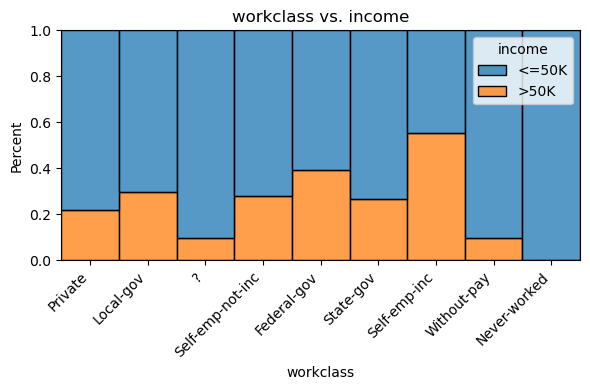

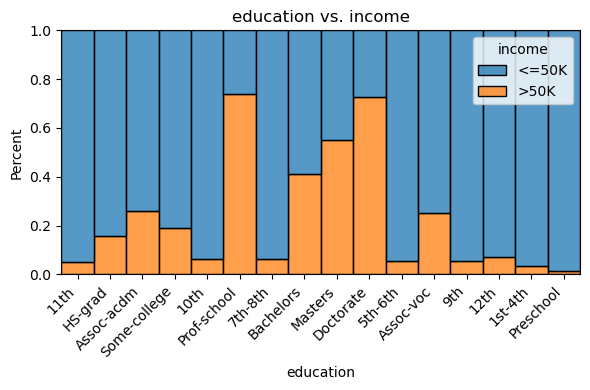

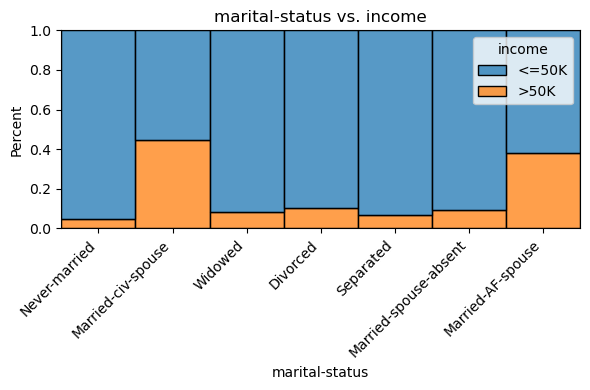

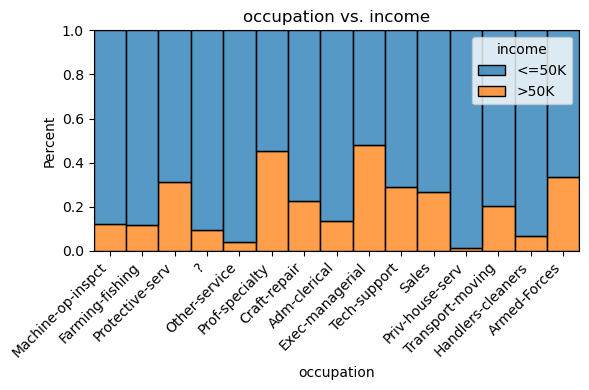

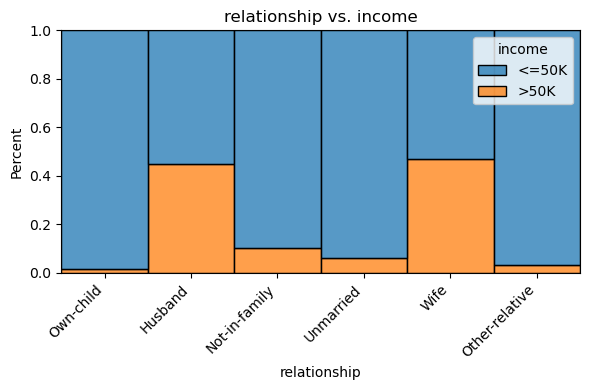

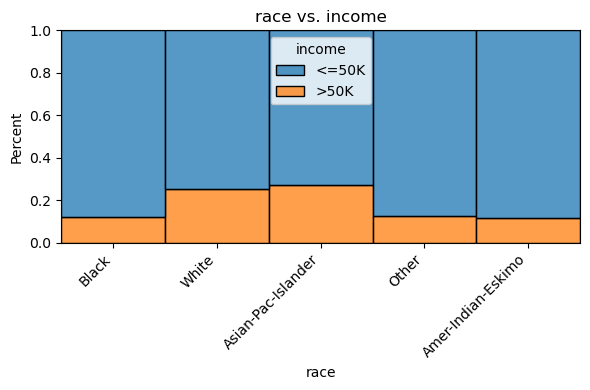

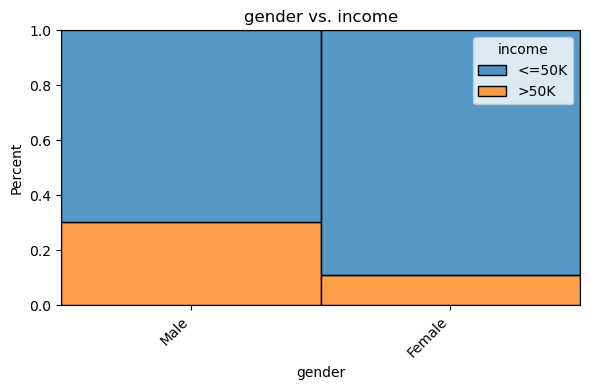

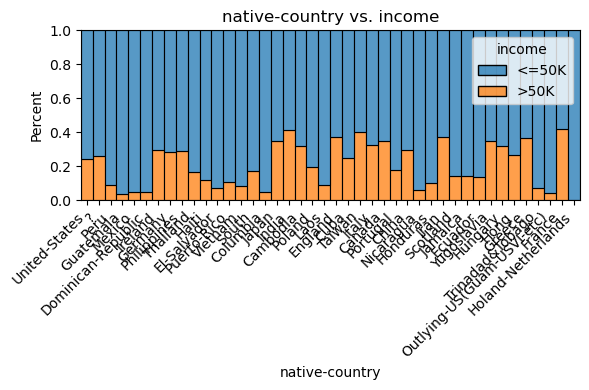

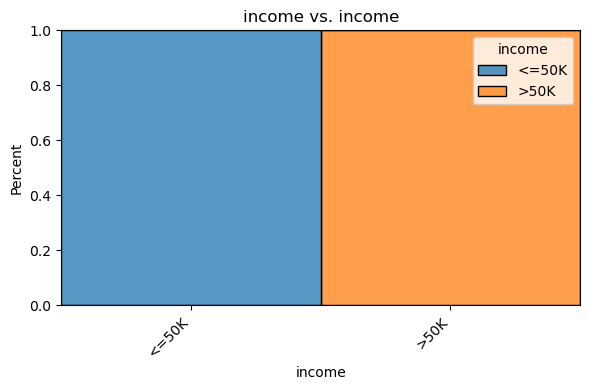

In [1762]:
for col in cat_cols:
  plot_categorical_vs_target(df=df, x=col, y=target, target_type='class')

## num_ columns

C:\Users\Work\AppData\Local\Temp\ipykernel_10668\1179884662.py:100: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.

C:\Users\Work\AppData\Local\Temp\ipykernel_10668\1179884662.py:100: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.

C:\Users\Work\AppData\Local\Temp\ipykernel_10668\1179884662.py:100: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.

C:\Users\Work\AppData\Local\Temp\ipykernel_10668\1179884662.py:100: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.

C:\Users\Work\AppData\Local\Temp\ipykernel_10668\1179884662.py:100: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, w

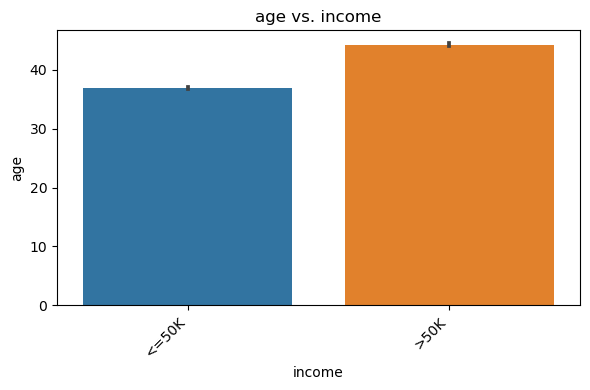

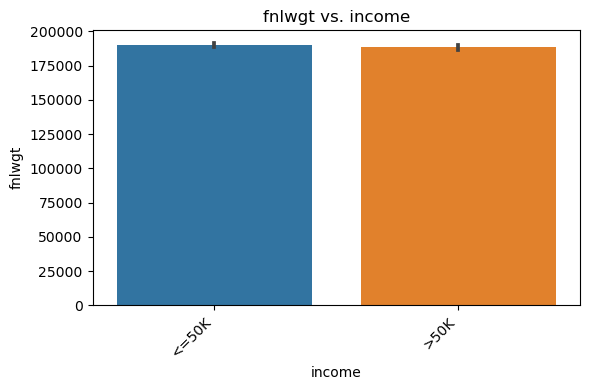

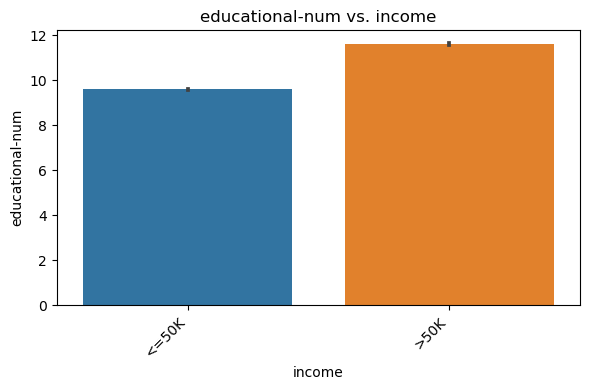

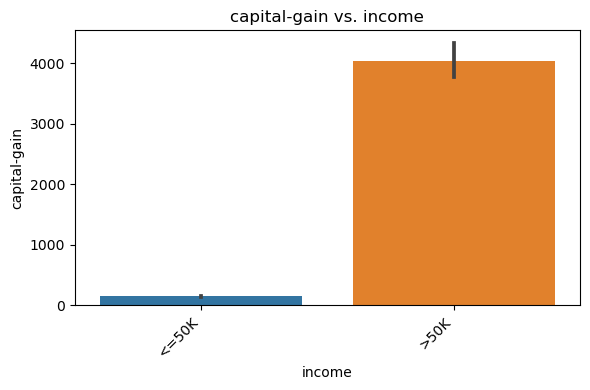

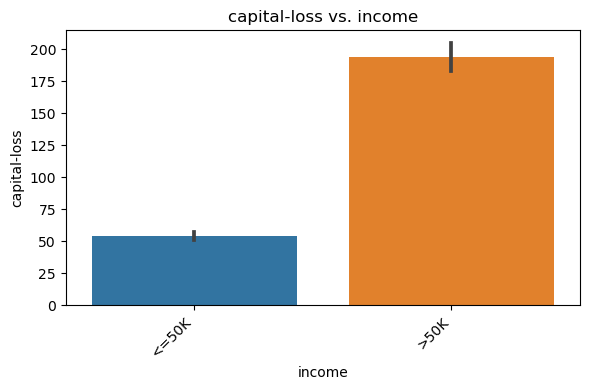

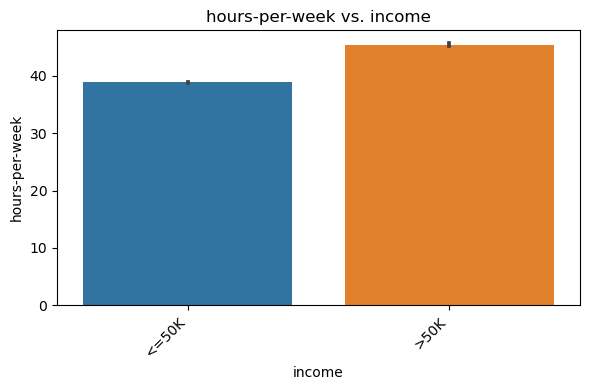

In [1763]:
for col in num_cols:
  plot_numeric_vs_target(df=df, x=col, y=target, target_type='class')

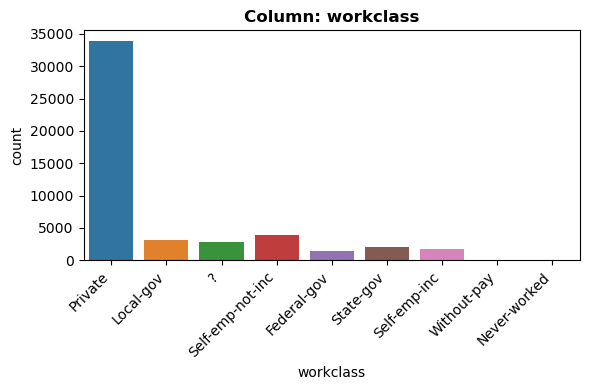

- NaN's Found: 0 (0.0%)
- Unique Values: 9
- Most common value: 'Private' occurs 33860 times (69.4%)
- Not constant or quasi-constant.


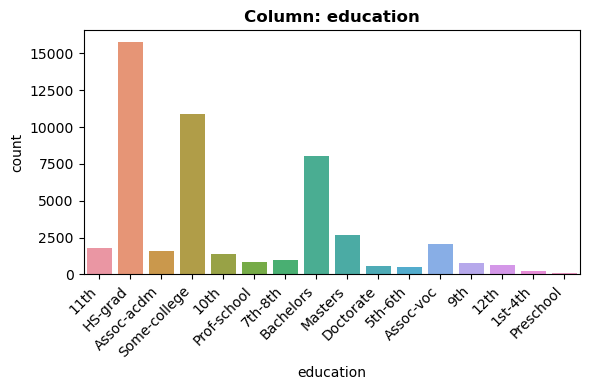

- NaN's Found: 0 (0.0%)
- Unique Values: 16
- Most common value: 'HS-grad' occurs 15770 times (32.32%)
- Not constant or quasi-constant.


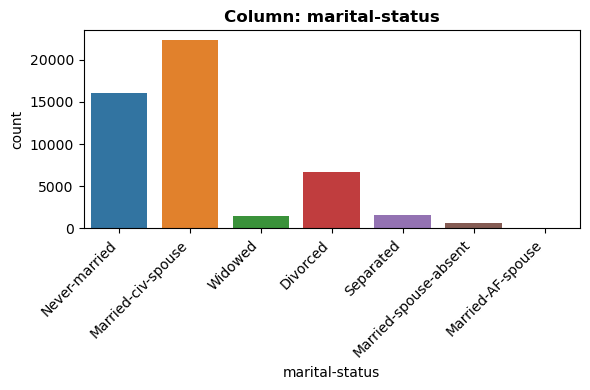

- NaN's Found: 0 (0.0%)
- Unique Values: 7
- Most common value: 'Married-civ-spouse' occurs 22366 times (45.84%)
- Not constant or quasi-constant.


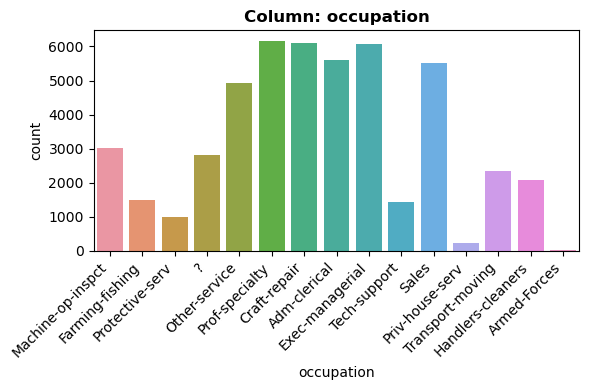

- NaN's Found: 0 (0.0%)
- Unique Values: 15
- Most common value: 'Prof-specialty' occurs 6165 times (12.64%)
- Not constant or quasi-constant.


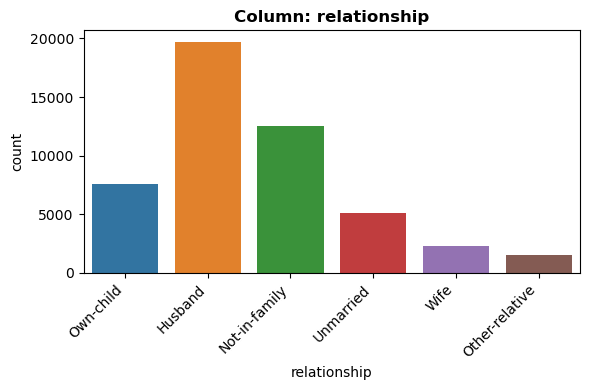

- NaN's Found: 0 (0.0%)
- Unique Values: 6
- Most common value: 'Husband' occurs 19703 times (40.38%)
- Not constant or quasi-constant.


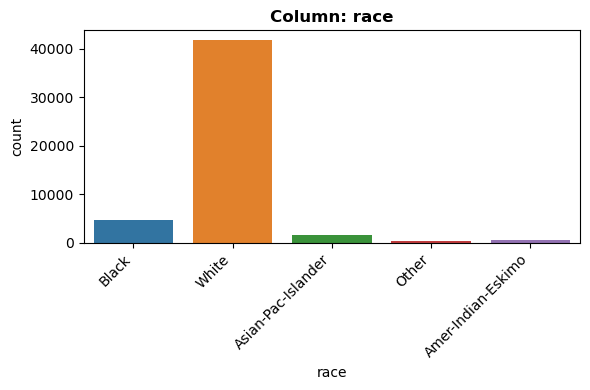

- NaN's Found: 0 (0.0%)
- Unique Values: 5
- Most common value: 'White' occurs 41714 times (85.5%)
- Not constant or quasi-constant.


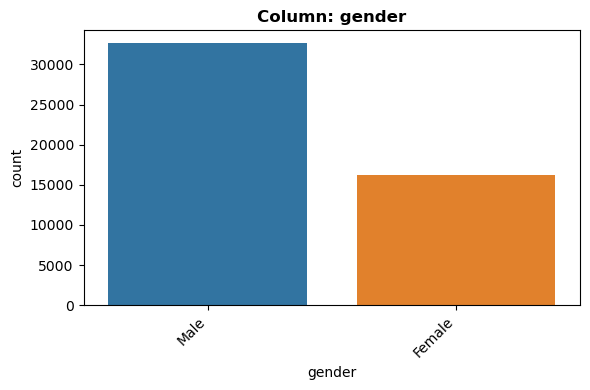

- NaN's Found: 0 (0.0%)
- Unique Values: 2
- Most common value: 'Male' occurs 32614 times (66.85%)
- Not constant or quasi-constant.


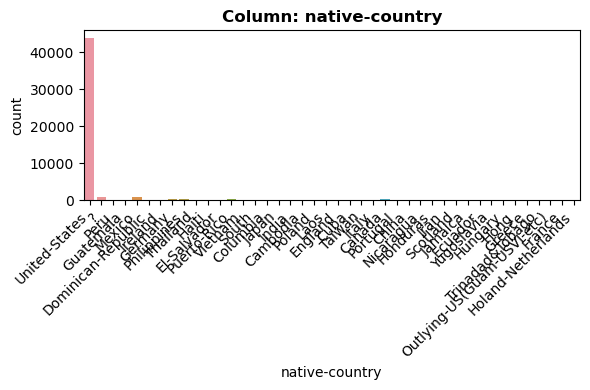

- NaN's Found: 0 (0.0%)
- Unique Values: 42
- Most common value: 'United-States' occurs 43792 times (89.76%)
- Not constant or quasi-constant.


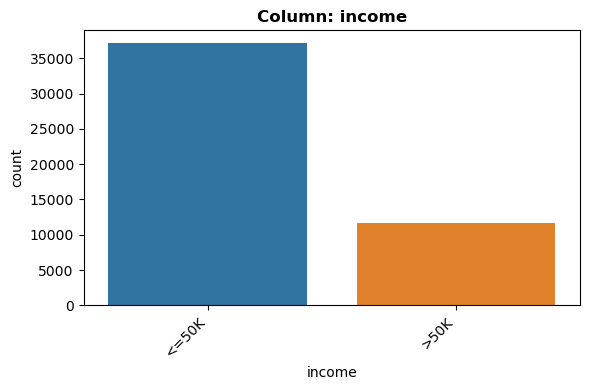

- NaN's Found: 0 (0.0%)
- Unique Values: 2
- Most common value: '<=50K' occurs 37109 times (76.06%)
- Not constant or quasi-constant.


In [1764]:
for col in cat_cols:
  explore_categorical(df=df, x=col)


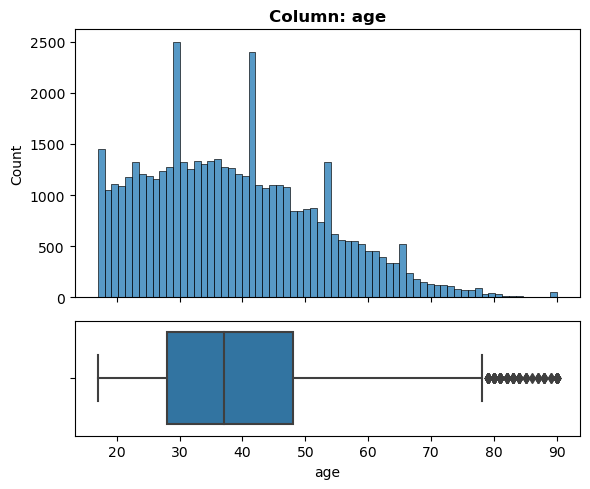

- NaN's Found: 0 (0.0%)
- Unique Values: 74
- Most common value: '36' occurs 1348 times (2.76%)
- Not constant or quasi-constant.


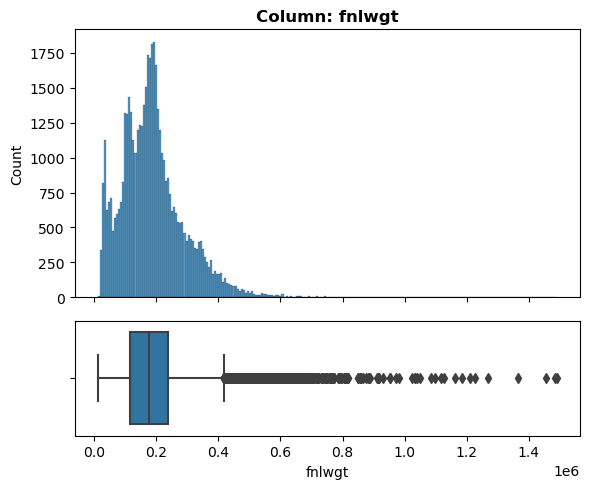

- NaN's Found: 0 (0.0%)
- Unique Values: 28523
- Most common value: '203488' occurs 21 times (0.04%)
- Not constant or quasi-constant.


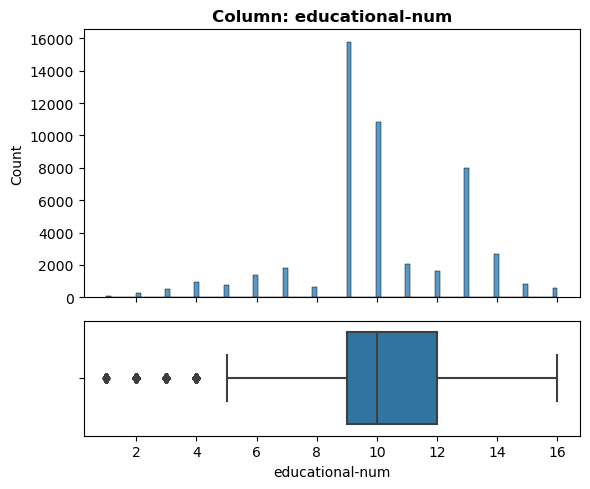

- NaN's Found: 0 (0.0%)
- Unique Values: 16
- Most common value: '9' occurs 15770 times (32.32%)
- Not constant or quasi-constant.


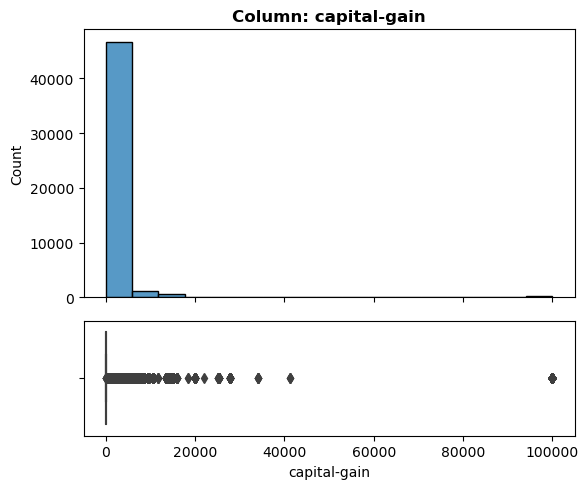

- NaN's Found: 0 (0.0%)
- Unique Values: 123
- Most common value: '0' occurs 44755 times (91.73%)
- Not constant or quasi-constant.


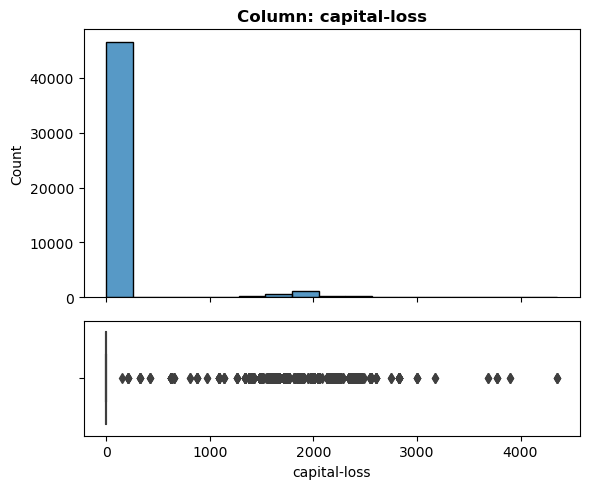

- NaN's Found: 0 (0.0%)
- Unique Values: 99
- Most common value: '0' occurs 46508 times (95.32%)
- Not constant or quasi-constant.


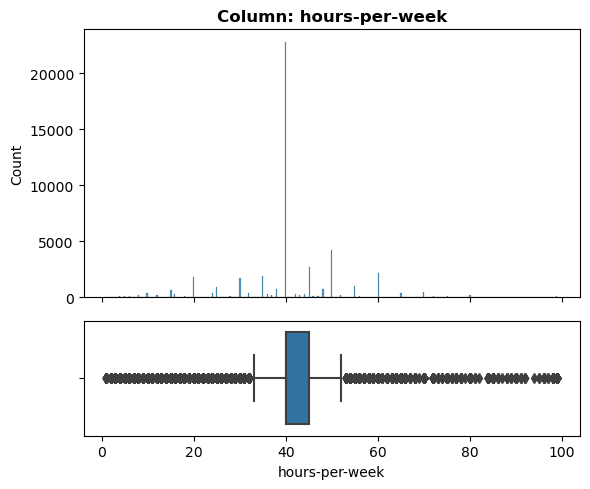

- NaN's Found: 0 (0.0%)
- Unique Values: 96
- Most common value: '40' occurs 22773 times (46.68%)
- Not constant or quasi-constant.


In [1765]:
for col in num_cols:
  explore_numeric(df=df, x=col)


# features engineer

### lets change 'age' to decades, this improves model recall for '>50K' by 4%.


In [1766]:
df['age'] = df['age'].round(-1).astype(int)
df['age'].value_counts()

40    13279
30    11374
20     9599
50     7670
60     5066
70     1358
80      378
90       66
Name: age, dtype: int64

### if we look at 'education' , it's looks the same as 'educational-num' (Ex: 11th = 7). so we will drop 'education'.

In [1767]:
(df['education'] == '11th').sum()

1812

In [1768]:
(df['educational-num'] == 7).sum()

1812

In [1769]:
df[['education', 'educational-num']]

,education,educational-num
0,11th,7
1,HS-grad,9
2,Assoc-acdm,12
3,Some-college,10
4,Some-college,10
...,...,...
48837,Assoc-acdm,12
48838,HS-grad,9
48839,HS-grad,9
48840,HS-grad,9


In [1770]:
drop_col = ['education']
df = df.drop(columns=drop_col)

### when we look at 'native-country' feature, we see that almost all the data belong to 'United-States' (89% of the data), and the other country have their own situations. so we will drop all the data that come outside the United-States (USA).


In [1771]:
filter_usa = df['native-country'] == 'United-States'
percent_of_other = (len(df[~filter_usa])/len(df[filter_usa])) *100
print(f'the percent of USA data is {100-round(percent_of_other,2)}%')
print(f'the percent of all the other countries in the data is {round(percent_of_other,2)}%')

the percent of USA data is 88.59%
the percent of all the other countries in the data is 11.41%


In [1772]:
df = df[filter_usa]
drop_col = ['native-country']
df = df.drop(columns=drop_col)
df.head()

,age,workclass,fnlwgt,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,income
0,20,Private,226802,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,<=50K
1,40,Private,89814,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,<=50K
2,30,Local-gov,336951,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,>50K
3,40,Private,160323,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,>50K
4,20,?,103497,10,Never-married,?,Own-child,White,Female,0,0,30,<=50K


### if we look at visualization of 'marital-status' feature , we see that All individuals who are in a normal and stable family relationship have a higher income.
  - so that we will rename (Never-married, Divorced, Separated, Widowed, Married-spouse-absent) to 'There is no partner(NO-partner)', and (Married-civ-spouse, Married-AF-spouse) to 'There is a partner'

In [1773]:
df['marital-status'].value_counts()

Married-civ-spouse       19990
Never-married            14458
Divorced                  6205
Widowed                   1378
Separated                 1333
Married-spouse-absent      392
Married-AF-spouse           36
Name: marital-status, dtype: int64

(<Figure size 600x400 with 1 Axes>,
 <Axes: title={'center': 'marital-status vs. income'}, xlabel='marital-status', ylabel='Percent'>)

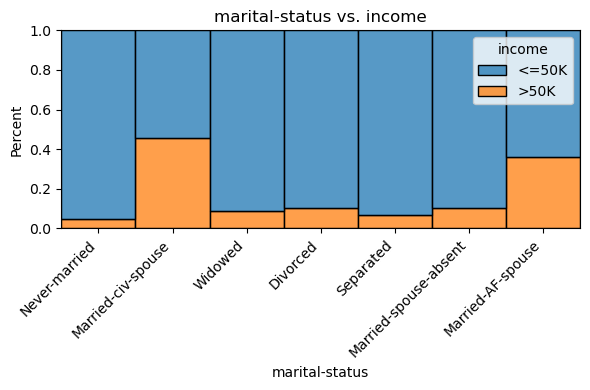

In [1774]:
target = 'income'
col='marital-status'
plot_categorical_vs_target(df=df, x=col, y=target, target_type='class')

In [1775]:
rename_condition = {
      'Married-civ-spouse': 'There is a partner',
      'Never-married': 'There is no partner(NO-partner)',
      'Divorced': 'There is no partner(NO-partner)',
      'Separated': 'There is no partner(NO-partner)',
      'Widowed': 'There is no partner(NO-partner)',
      'Married-spouse-absent': 'There is no partner(NO-partner)',
      'Married-AF-spouse': 'There is a partner'
              }
df['marital-status'] = df['marital-status'].replace(rename_condition)
df['marital-status'].value_counts(dropna=False, normalize=True)

There is no partner(NO-partner)    0.542702
There is a partner                 0.457298
Name: marital-status, dtype: float64

(<Figure size 600x400 with 1 Axes>,
 <Axes: title={'center': 'marital-status vs. income'}, xlabel='marital-status', ylabel='Percent'>)

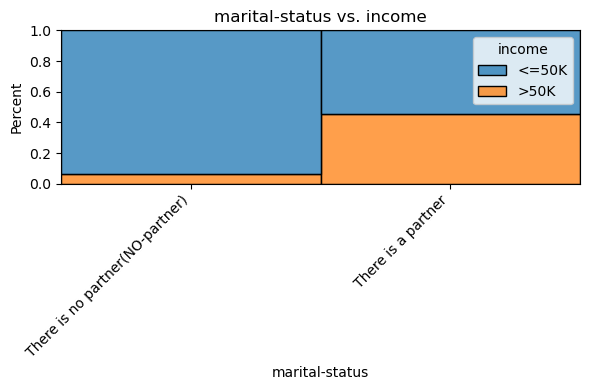

In [1776]:
plot_categorical_vs_target(df=df, x=col, y=target, target_type='class')

### if we look at visualization of 'relationship' feature , we see that all individuals who have a primary role in the family (head of household) have higher incomes than the rest. The reason lies in the fact that most individuals will not be able to start a family if they do not have a stable and good income. Also, the presence of social obligations forces the person to improve his income and reduce risks.
  - so that we will rename (Not-in-family, Own-child, Unmarried, Other-relative) to 'has no obligations to the group' , and (Husband, Wife) to 'Head of household (has obligations to his group)'

In [1777]:
df['relationship'].value_counts()

Husband           17720
Not-in-family     11401
Own-child          7021
Unmarried          4526
Wife               2045
Other-relative     1079
Name: relationship, dtype: int64

(<Figure size 600x400 with 1 Axes>,
 <Axes: title={'center': 'relationship vs. income'}, xlabel='relationship', ylabel='Percent'>)

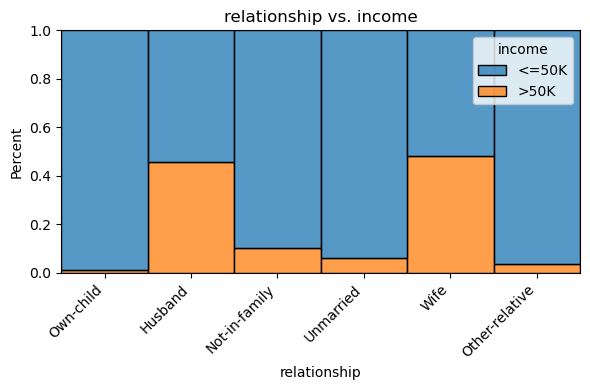

In [1778]:
target = 'income'
col='relationship'
plot_categorical_vs_target(df=df, x=col, y=target, target_type='class', figsize=(6,4))

In [1779]:
rename_relationship = {
        'Husband': 'Head of household (has obligations to his group)',
        'Not-in-family': 'has no obligations to the group',
        'Own-child': 'has no obligations to the group',
        'Unmarried': 'has no obligations to the group',
        'Wife': 'Head of household (has obligations to his group)',
        'Other-relative': 'has no obligations to the group'
              }
df['relationship'] = df['relationship'].replace(rename_relationship)
df['relationship'].value_counts(dropna=False, normalize=True)

has no obligations to the group                     0.548662
Head of household (has obligations to his group)    0.451338
Name: relationship, dtype: float64

(<Figure size 600x600 with 1 Axes>,
 <Axes: title={'center': 'relationship vs. income'}, xlabel='relationship', ylabel='Percent'>)

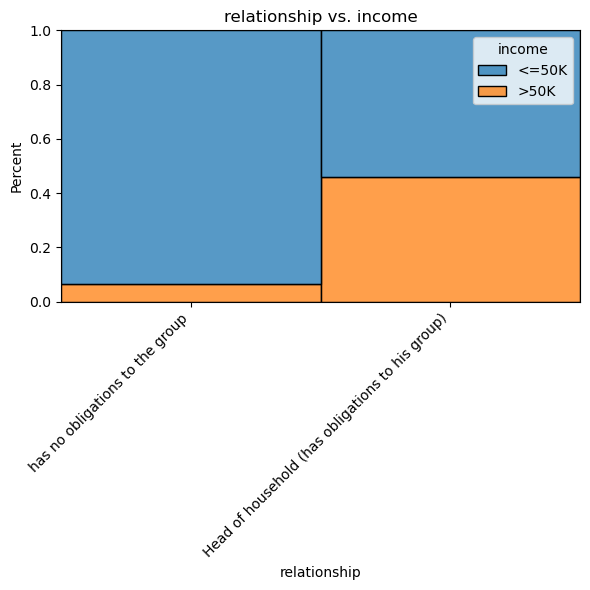

In [1780]:
plot_categorical_vs_target(df=df, x=col, y=target, target_type='class', figsize=(6,6))

###  'capital-gain' and 'capital-loss' , all the peoples in this data who they have 'capital-gain' =0 or 'capital-loss' =0, mean that they not loss or gain.
  - It was found that when maintaining each feature alone without combining them, the accuracy improved by 0.01

In [1781]:
# filter_capital_eq = (df['capital-gain'] == df['capital-loss']) & (df['capital-gain'] != 0)
# df[filter_capital_eq].count().sum()

In [1782]:
# filter_cap = (df['capital-gain'] - df['capital-loss']) > 0
# df[filter_cap]['income'].value_counts(dropna=False, normalize=True)

In [1783]:
# filter_cap = (df['capital-gain'] - df['capital-loss']) < 0
# df[filter_cap]['income'].value_counts(dropna=False, normalize=True)

In [1784]:
# df['net-capitalist'] = df['capital-gain'] - df['capital-loss']
# df = df.drop(columns=['capital-gain', 'capital-loss'])
# df.head()

### 'hours-per-week': no change

In [1785]:
filter_houer = (df['hours-per-week']  < 40)
df[filter_houer]['income'].value_counts()

<=50K    9542
>50K     1007
Name: income, dtype: int64

In [1786]:
filter_houer = (df['hours-per-week']  ==  40)
df[filter_houer]['income'].value_counts()

<=50K    15726
>50K      4370
Name: income, dtype: int64

In [1787]:
filter_houer = (df['hours-per-week']  > 40)
df[filter_houer]['income'].value_counts()

<=50K    7836
>50K     5311
Name: income, dtype: int64

In [1788]:
df[~filter_houer]['income'].value_counts()

<=50K    25268
>50K      5377
Name: income, dtype: int64

In [1789]:
df['income'].value_counts()

<=50K    33104
>50K     10688
Name: income, dtype: int64

### 'occupation': no change

In [1790]:
df['occupation'].value_counts()

Exec-managerial      5602
Prof-specialty       5500
Craft-repair         5496
Adm-clerical         5135
Sales                5075
Other-service        4180
Machine-op-inspct    2557
?                    2536
Transport-moving     2184
Handlers-cleaners    1808
Tech-support         1327
Farming-fishing      1303
Protective-serv       921
Priv-house-serv       154
Armed-Forces           14
Name: occupation, dtype: int64

### 'fnlwgt': drop

In [1791]:
avg_fnlwgt_in_below50K = df[df['income'] == '<=50K']['fnlwgt'].sum() / len(df[df['income'] == '<=50K']['fnlwgt'])
avg_fnlwgt_in_above50K = df[df['income'] == '>50K']['fnlwgt'].sum() / len(df[df['income'] == '>50K']['fnlwgt'])
print(f'The ratio of the rate of "<=50K" to the rate of ">50K" is: {round(avg_fnlwgt_in_above50K/avg_fnlwgt_in_below50K,2)}')

The ratio of the rate of "<=50K" to the rate of ">50K" is: 1.0


In [1792]:
df = df.drop(columns='fnlwgt')

### 'workclass', 'occupation'

In [1793]:
df['workclass'].isna().sum()
df['occupation'].isna().sum()

0

In [1794]:
print(len(df['workclass'].value_counts(dropna=False)))
print(len(df['occupation'].value_counts(dropna=False)))

9
15


In [1795]:
def findI(arr, name, value):
  for i in range(len(arr)):
    if arr[i][0] == name:
      arr[i].append(value)
  return arr


arr1 = []
workclass = df['workclass'].fillna('?').value_counts(dropna=False).index
for i in workclass:
  arr1.append([i])


# df.loc[i, 'workclass'] == df.loc[i, 'occupation']
index_df = df.index
count = 0
for i in index_df:
  name = df.loc[i, 'workclass']
  value = df.loc[i, 'occupation']
  # arr1[z].append(df.loc[i, 'occupation'])
  arr1 = findI(arr1, name, value)

In [1796]:
def valueCounts(arr):
  temp = []
  arr = arr[1:]
  for i in range(len(arr)):
    if arr[i] not in temp:
      temp.append(arr[i])
  return temp

In [1797]:
for i in range(len(arr1)):
  print(f'{arr1[i][0]} = {len(arr1[i])-1}')

Private = 30111
Self-emp-not-inc = 3509
Local-gov = 2941
? = 2526
State-gov = 1840
Self-emp-inc = 1515
Federal-gov = 1320
Without-pay = 20
Never-worked = 10


In [1798]:
for i in arr1:
  print(f'"{i[0]}" length= {len(i[0])} ==> {valueCounts(i)} \n')

"Private" length= 7 ==> ['Machine-op-inspct', 'Farming-fishing', 'Other-service', 'Craft-repair', 'Adm-clerical', 'Exec-managerial', 'Tech-support', 'Prof-specialty', 'Transport-moving', 'Priv-house-serv', 'Handlers-cleaners', 'Sales', 'Protective-serv'] 

"Self-emp-not-inc" length= 16 ==> ['Prof-specialty', 'Craft-repair', 'Other-service', 'Sales', 'Exec-managerial', 'Transport-moving', 'Farming-fishing', 'Adm-clerical', 'Machine-op-inspct', 'Tech-support', 'Protective-serv', 'Handlers-cleaners'] 

"Local-gov" length= 9 ==> ['Protective-serv', 'Prof-specialty', 'Exec-managerial', 'Adm-clerical', 'Craft-repair', 'Transport-moving', 'Other-service', 'Tech-support', 'Handlers-cleaners', 'Machine-op-inspct', 'Farming-fishing', 'Sales'] 

"?" length= 1 ==> ['?'] 

"State-gov" length= 9 ==> ['Other-service', 'Exec-managerial', 'Farming-fishing', 'Adm-clerical', 'Machine-op-inspct', 'Transport-moving', 'Protective-serv', 'Craft-repair', 'Prof-specialty', 'Tech-support', 'Sales', 'Handlers-cl

In [1799]:
fillter1 = (df['workclass'] == 'Self-emp-not-inc') & (df['occupation'] == 'Prof-specialty')
fillter2 = (df['workclass'] == 'Private') & (df['occupation'] == 'Prof-specialty')
# df[fillter1]
print(df[fillter1][['workclass', 'occupation']].head(1))
df[fillter2][['workclass', 'occupation']].head(1)

          workclass      occupation
7  Self-emp-not-inc  Prof-specialty


,workclass,occupation
24,Private,Prof-specialty


In [1800]:
fillter3 = (df['workclass'] == '?') & (df['occupation'] == '?')
df[fillter3]

,age,workclass,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,income
4,20,?,10,There is no partner(NO-partner),?,has no obligations to the group,White,Female,0,0,30,<=50K
6,30,?,9,There is no partner(NO-partner),?,has no obligations to the group,Black,Male,0,0,40,<=50K
13,60,?,9,There is a partner,?,Head of household (has obligations to his group),White,Male,0,0,35,<=50K
22,70,?,4,There is no partner(NO-partner),?,has no obligations to the group,White,Female,0,0,6,<=50K
35,60,?,9,There is a partner,?,Head of household (has obligations to his group),White,Male,0,0,40,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...
48811,40,?,13,There is a partner,?,Head of household (has obligations to his group),White,Female,0,0,55,>50K
48812,30,?,13,There is no partner(NO-partner),?,has no obligations to the group,Asian-Pac-Islander,Female,0,0,99,<=50K
48820,70,?,16,There is a partner,?,Head of household (has obligations to his group),White,Male,0,0,10,>50K
48822,40,?,9,There is no partner(NO-partner),?,has no obligations to the group,Black,Female,0,0,32,<=50K


### now all the values == '?', we will change it to NaN and imputed later.

In [1801]:
df.isna().sum().sum()

0

In [1802]:
(df == '?').sum().sum()

5062

In [1803]:
df = df.replace({'?': np.nan})
df.isna().sum().sum()

5062

In [1804]:
df.count() - df.dropna().count()

age                2536
workclass            10
educational-num    2536
marital-status     2536
occupation            0
relationship       2536
race               2536
gender             2536
capital-gain       2536
capital-loss       2536
hours-per-week     2536
income             2536
dtype: int64

In [1805]:
(df.count() - df.dropna().count())/df.count()

age                0.057910
workclass          0.000242
educational-num    0.057910
marital-status     0.057910
occupation         0.000000
relationship       0.057910
race               0.057910
gender             0.057910
capital-gain       0.057910
capital-loss       0.057910
hours-per-week     0.057910
income             0.057910
dtype: float64

In [1806]:
df.isna().sum()

age                   0
workclass          2526
educational-num       0
marital-status        0
occupation         2536
relationship          0
race                  0
gender                0
capital-gain          0
capital-loss          0
hours-per-week        0
income                0
dtype: int64

# preproces and modeling the data

In [1807]:
preprocessor, X_train, y_train, X_test, y_test = preprocessor_maker(df = df, target=target, cat_scale=True)

In [1808]:
y_train.value_counts(dropna=False, normalize=True)

<=50K    0.756424
>50K     0.243576
Name: income, dtype: float64

In [1809]:
X_train_tf = preprocessor.fit_transform(X_train)
X_test_tf = preprocessor.transform(X_test)

In [1810]:
# from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state = 42)
X_train_sm,y_train_sm = smote.fit_resample(X_train_tf, y_train)
y_train_sm.value_counts()

<=50K    24844
>50K     24844
Name: income, dtype: int64

----------------------------------------------------------------------
 Classification Metrics: Training Data
----------------------------------------------------------------------
              precision    recall  f1-score   support

       <=50K       0.96      0.93      0.94     24844
        >50K       0.93      0.96      0.94     24844

    accuracy                           0.94     49688
   macro avg       0.94      0.94      0.94     49688
weighted avg       0.94      0.94      0.94     49688



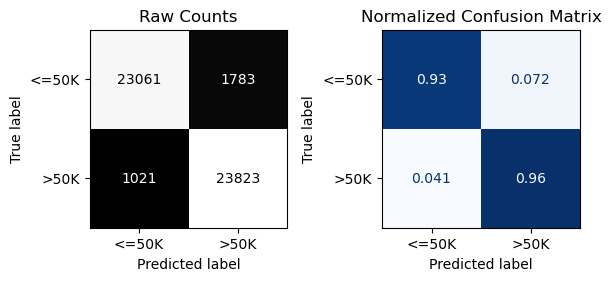


----------------------------------------------------------------------
 Classification Metrics: Test Data
----------------------------------------------------------------------
              precision    recall  f1-score   support

       <=50K       0.91      0.87      0.89      8260
        >50K       0.65      0.73      0.69      2688

    accuracy                           0.84     10948
   macro avg       0.78      0.80      0.79     10948
weighted avg       0.84      0.84      0.84     10948



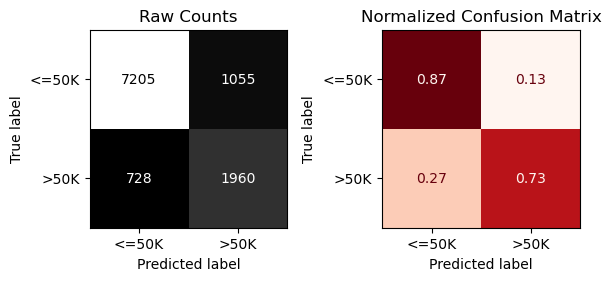

In [1811]:
rf_clf = RandomForestClassifier(random_state=42)
rf_clf.fit(X_train_sm, y_train_sm)
evaluate_classification(rf_clf, X_train_sm, y_train_sm, X_test_tf, y_test)

## Extract and visualize the top 10 features using permutation importance (from Intro to ML Week 4)


In [1812]:
from sklearn.inspection import permutation_importance
# Permutation importance takes a fit model and the test data.
r = permutation_importance(rf_clf, X_test_tf, y_test,n_repeats =5, random_state = SEED)
r.keys()

dict_keys(['importances_mean', 'importances_std', 'importances'])

In [1813]:
## can make the mean importances into a series
permutation_importances = pd.Series(r['importances_mean'],index=X_test_tf.columns,
                           name = 'permutation importance')
permutation_importances = permutation_importances.sort_values(ascending=False)
permutation_importances.head()

capital-gain       0.038363
educational-num    0.025283
age                0.015455
capital-loss       0.007910
hours-per-week     0.007362
Name: permutation importance, dtype: float64

In [1814]:
rf_importance = pd.Series(rf_clf.feature_importances_, index= rf_clf.feature_names_in_, name = 'Feature Importance')

In [1815]:
rf_importance.sort_values().tail(15).sum()*100

91.62933409748312

In [1816]:
colors_top10 = get_color_dict(rf_importance, top_n=10)

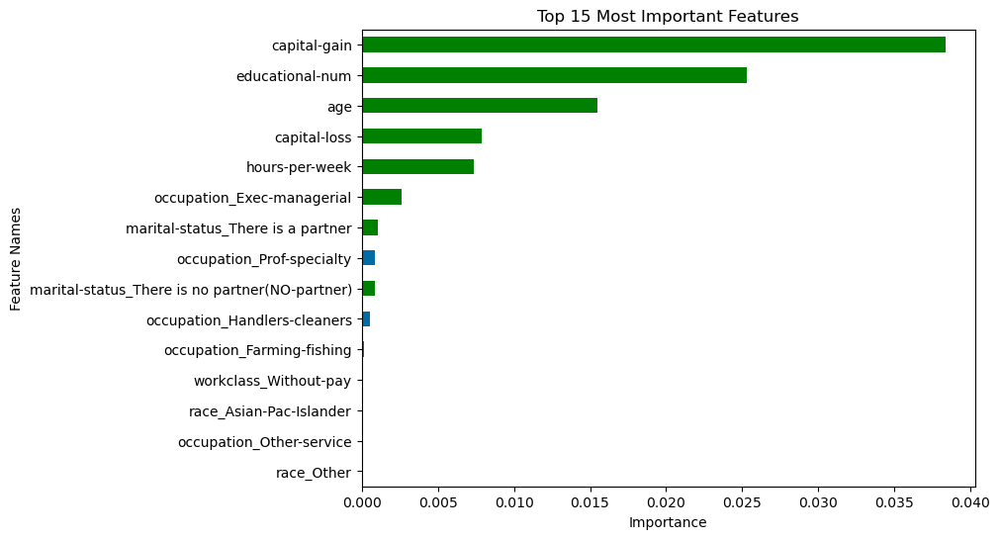

In [1817]:
plot_importance_color(permutation_importances, color_dict=colors_top10,top_n=15);

## evaluate with the origin data(without data eng.)

----------------------------------------------------------------------
 Classification Metrics: Training Data
----------------------------------------------------------------------
              precision    recall  f1-score   support

       <=50K       1.00      1.00      1.00     27801
        >50K       1.00      1.00      1.00     27801

    accuracy                           1.00     55602
   macro avg       1.00      1.00      1.00     55602
weighted avg       1.00      1.00      1.00     55602



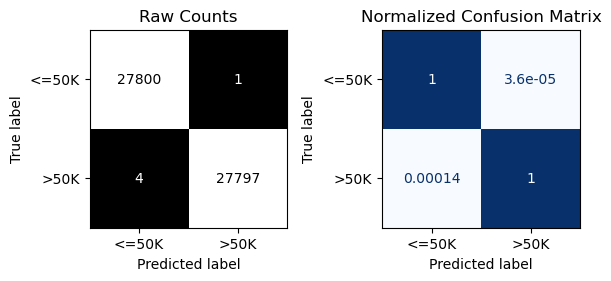


----------------------------------------------------------------------
 Classification Metrics: Test Data
----------------------------------------------------------------------
              precision    recall  f1-score   support

       <=50K       0.91      0.89      0.90      9354
        >50K       0.67      0.71      0.69      2857

    accuracy                           0.85     12211
   macro avg       0.79      0.80      0.79     12211
weighted avg       0.85      0.85      0.85     12211



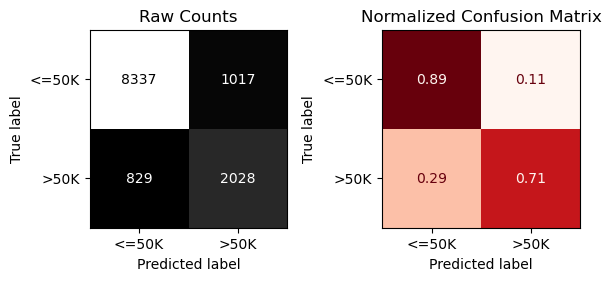

In [1818]:
df_2 = pd.read_csv('adult.csv')
preprocessor_2, X_train_2, y_train_2, X_test_2, y_test_2 = preprocessor_maker(df = df_test, target='income', cat_scale=True)

X_train_tf_2 = preprocessor.fit_transform(X_train_2)
X_test_tf_2 = preprocessor.transform(X_test_2)
# from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state = 42)
X_train_sm_2,y_train_sm_2 = smote.fit_resample(X_train_tf_2, y_train_2)

rf_clf_2 = RandomForestClassifier(random_state=42)
rf_clf_2.fit(X_train_sm_2, y_train_sm_2)
evaluate_classification(rf_clf_2, X_train_sm_2, y_train_sm_2, X_test_tf_2, y_test_2)

## We can see that we improve the model a little. but we:-
  1. Decrease the number of features in our model from '108' to '40' (63%).
  2. And we have greatly reduced the overfitting in our model (35% on the accuracy, and 40% on the macro avg, and 50% on weighted avg).
  3. All that only with engineering the data.

In [1819]:
num_no_eng = len(rf_clf_2.feature_names_in_)
num_eng = len(rf_clf.feature_names_in_)

print(f'The number of features in the original data (without features engineer) = {num_no_eng}.')
print(f'The number of features in the engineered data (with features engineer) = {num_eng}')

The number of features in the original data (without features engineer) = 50.
The number of features in the engineered data (with features engineer) = 40


# let's check the data using PCA


In [1826]:
import plotly.express as px
import plotly.io as pio


def update_scatter3d(fig):
    fig.update_traces({'marker':{'size':2}})
    fig.show(config={'scrollZoom':True})


# Make a 3d scatter plot with a PC on each axis and color by the target
# Change template style to plotly_dark
fig = px.scatter_3d(plot_df_pca, x='pca0',y='pca1',z='pca2', width=800, height=600, color = "income", template = 'plotly_dark')
update_scatter3d(fig)

# check the data with PCA and clustering

In [1830]:
fig = px.scatter_3d(plot_df_pca, x='pca0',y='pca1',z='pca2', width=800, height=600, color = "cluster", template = 'plotly_dark')
update_scatter3d(fig)

# let's try to find the best 'n_clusters', maybe we can Improve our model

In [1841]:
from sklearn.metrics import ConfusionMatrixDisplay, classification_report
def classification_metrics(y_true, y_pred, label="",
                           output_dict=False, figsize=(8,4),
                           normalize='true', cmap='Blues',
                           colorbar=False):
  # Get the classification report
  report = classification_report(y_true, y_pred)
  ## Print header and report
  header = "-"*70
  print(header, f" Classification Metrics: {label}", header, sep='\n')
  print(report)
  ## CONFUSION MATRICES SUBPLOTS
#   fig, axes = plt.subplots(ncols=2, figsize=figsize)
#   # create a confusion matrix  of raw counts
#   ConfusionMatrixDisplay.from_predictions(y_true, y_pred,
#                 normalize=None, cmap='gist_gray', colorbar=colorbar,
#                 ax = axes[0],);
#   axes[0].set_title("Raw Counts")
#   # create a confusion matrix with the test data
#   ConfusionMatrixDisplay.from_predictions(y_true, y_pred,
#                 normalize=normalize, cmap=cmap, colorbar=colorbar,
#                 ax = axes[1]);
#   axes[1].set_title("Normalized Confusion Matrix")
#   # Adjust layout and show figure
#   fig.tight_layout()
#   plt.show()
#   # Return dictionary of classification_report
  if output_dict==True:
    report_dict = classification_report(y_true, y_pred, output_dict=True)
    return report_dict



def evaluate_classification(model, X_train, y_train, X_test, y_test,
                         figsize=(6,4), normalize='true', output_dict = False,
                            cmap_train='Blues', cmap_test="Reds",colorbar=False):
  # Get predictions for training data
  y_train_pred = model.predict(X_train)
  # Call the helper function to obtain regression metrics for training data
  results_train = classification_metrics(y_train, y_train_pred, #verbose = verbose,
                                     output_dict=True, figsize=figsize,
                                         colorbar=colorbar, cmap=cmap_train,
                                     label='Training Data')
  print()
  # Get predictions for test data
  y_test_pred = model.predict(X_test)
  # Call the helper function to obtain regression metrics for test data
  results_test = classification_metrics(y_test, y_test_pred, #verbose = verbose,
                                  output_dict=True,figsize=figsize,
                                         colorbar=colorbar, cmap=cmap_test,
                                    label='Test Data' )
  if output_dict == True:
    # Store results in a dataframe if ouput_frame is True
    results_dict = {'train':results_train,
                    'test': results_test}
    return results_dict

In [1842]:
def test(n_clusters=n_clusters, X_train_sm=X_train_sm, X_test_tf=X_test_tf):

    # Instantiate KMeans
    kmeans = KMeans(n_clusters = n_clusters, n_init = 'auto', random_state = 42)
    kmeans.fit(X_train_sm)
    X_train_cl = X_train_sm.copy()
    X_train_cl['cluster'] = kmeans.labels_

    # Instantiate KMeans
    kmeans1 = KMeans(n_clusters = n_clusters, n_init = 'auto', random_state = 42)
    kmeans1.fit(X_test_tf)
    X_test_cl = X_test_tf.copy()
    X_test_cl['cluster'] = kmeans1.labels_

    rf_clf_cl1 = RandomForestClassifier(random_state=42)
    rf_clf_cl1.fit(X_train_cl, y_train_sm)


    evaluate_classification(rf_clf_cl1, X_train_cl, y_train_sm, X_test_cl, y_test)

In [1843]:
for i in range(2,6,1):
    print('/'*30)
    print(i)
    test(n_clusters=i)
    

//////////////////////////////
2
----------------------------------------------------------------------
 Classification Metrics: Training Data
----------------------------------------------------------------------
              precision    recall  f1-score   support

       <=50K       0.96      0.93      0.94     24844
        >50K       0.93      0.96      0.94     24844

    accuracy                           0.94     49688
   macro avg       0.94      0.94      0.94     49688
weighted avg       0.94      0.94      0.94     49688


----------------------------------------------------------------------
 Classification Metrics: Test Data
----------------------------------------------------------------------
              precision    recall  f1-score   support

       <=50K       0.91      0.87      0.89      8260
        >50K       0.65      0.73      0.69      2688

    accuracy                           0.84     10948
   macro avg       0.78      0.80      0.79     10948
weighted 

In [1844]:
n_clusters = 21

scale = StandardScaler()

kmeans = KMeans(n_clusters = n_clusters, n_init = 'auto', random_state = 42)
y_train_sm_c = y_train_sm.copy()
y_train_sm_c = y_train_sm_c.map({'>50K': 1, '<=50K': 0})
y_train_sm_c.head()

0    0
1    0
2    0
3    0
4    0
Name: income, dtype: int64

In [1846]:
# scaled_train_df = pd.concat([X_train_sm, y_train_scale], axis=1)
scaled_train_df = pd.concat([X_train_sm, y_train_sm_c], axis=1)
scaled_train_df.head()

,age,educational-num,capital-gain,capital-loss,hours-per-week,workclass_Federal-gov,workclass_Local-gov,workclass_NA,workclass_Never-worked,workclass_Private,workclass_Self-emp-inc,workclass_Self-emp-not-inc,workclass_State-gov,workclass_Without-pay,marital-status_There is a partner,marital-status_There is no partner(NO-partner),occupation_Adm-clerical,occupation_Armed-Forces,occupation_Craft-repair,occupation_Exec-managerial,occupation_Farming-fishing,occupation_Handlers-cleaners,occupation_Machine-op-inspct,occupation_NA,occupation_Other-service,occupation_Priv-house-serv,occupation_Prof-specialty,occupation_Protective-serv,occupation_Sales,occupation_Tech-support,occupation_Transport-moving,relationship_Head of household (has obligations to his group),relationship_has no obligations to the group,race_Amer-Indian-Eskimo,race_Asian-Pac-Islander,race_Black,race_Other,race_White,gender_Female,gender_Male,income
0,-1.316868,-0.072736,-0.145803,-0.219028,-2.275166,-0.176568,-0.267549,-0.247931,-0.015609,0.675024,-0.189797,-0.29473,-0.211006,-0.022757,-0.915222,0.915222,-0.366112,-0.019118,-0.382292,-0.37962,-0.174726,-0.207279,-0.249725,-0.248484,3.103083,-0.059792,-0.380249,-0.146055,-0.361066,-0.177666,-0.228222,-0.903711,0.903711,-0.102579,-0.097773,-0.326674,-0.067961,0.370855,-0.705509,0.705509,0
1,-1.316868,-0.072736,-0.145803,-0.219028,1.883603,-0.176568,-0.267549,-0.247931,-0.015609,0.675024,-0.189797,-0.29473,-0.211006,-0.022757,-0.915222,0.915222,-0.366112,-0.019118,-0.382292,-0.37962,-0.174726,-0.207279,-0.249725,-0.248484,-0.322260,-0.059792,-0.380249,-0.146055,2.769574,-0.177666,-0.228222,-0.903711,0.903711,-0.102579,-0.097773,-0.326674,-0.067961,0.370855,-0.705509,0.705509,0
2,-1.316868,-0.072736,-0.145803,-0.219028,-2.275166,-0.176568,-0.267549,-0.247931,-0.015609,0.675024,-0.189797,-0.29473,-0.211006,-0.022757,-0.915222,0.915222,2.731408,-0.019118,-0.382292,-0.37962,-0.174726,-0.207279,-0.249725,-0.248484,-0.322260,-0.059792,-0.380249,-0.146055,-0.361066,-0.177666,-0.228222,-0.903711,0.903711,-0.102579,-0.097773,-0.326674,-0.067961,0.370855,1.417417,-1.417417,0
3,-1.316868,-0.491185,-0.145803,-0.219028,-0.275758,-0.176568,-0.267549,-0.247931,-0.015609,0.675024,-0.189797,-0.29473,-0.211006,-0.022757,-0.915222,0.915222,-0.366112,-0.019118,-0.382292,-0.37962,-0.174726,4.824411,-0.249725,-0.248484,-0.322260,-0.059792,-0.380249,-0.146055,-0.361066,-0.177666,-0.228222,-0.903711,0.903711,-0.102579,-0.097773,3.061160,-0.067961,-2.696473,-0.705509,0.705509,0
4,-1.316868,1.182613,-0.145803,-0.219028,1.163816,-0.176568,-0.267549,-0.247931,-0.015609,0.675024,-0.189797,-0.29473,-0.211006,-0.022757,-0.915222,0.915222,-0.366112,-0.019118,-0.382292,-0.37962,-0.174726,-0.207279,-0.249725,-0.248484,-0.322260,-0.059792,-0.380249,-0.146055,2.769574,-0.177666,-0.228222,-0.903711,0.903711,-0.102579,-0.097773,-0.326674,-0.067961,0.370855,-0.705509,0.705509,0


In [1847]:
kmeans.fit(scaled_train_df)

KMeans(n_clusters=21, n_init='auto', random_state=42)

In [1848]:
scale = StandardScaler()


# Scale the data
mean_value = kmeans.labels_.mean()
std_dev = kmeans.labels_.std()
# Calculate Z-scores for each data point
scaler = (kmeans.labels_ - mean_value) / std_dev
kmeans_labels__scaled = pd.Series(scaler, name='income')
kmeans_labels__scaled.head()

0   -0.353587
1    1.388664
2   -0.195200
3    0.438345
4    1.388664
Name: income, dtype: float64

In [1849]:
X_train_cl = X_train_sm.copy()
X_train_cl['cluster'] = kmeans_labels__scaled
X_train_cl.head()

,age,educational-num,capital-gain,capital-loss,hours-per-week,workclass_Federal-gov,workclass_Local-gov,workclass_NA,workclass_Never-worked,workclass_Private,workclass_Self-emp-inc,workclass_Self-emp-not-inc,workclass_State-gov,workclass_Without-pay,marital-status_There is a partner,marital-status_There is no partner(NO-partner),occupation_Adm-clerical,occupation_Armed-Forces,occupation_Craft-repair,occupation_Exec-managerial,occupation_Farming-fishing,occupation_Handlers-cleaners,occupation_Machine-op-inspct,occupation_NA,occupation_Other-service,occupation_Priv-house-serv,occupation_Prof-specialty,occupation_Protective-serv,occupation_Sales,occupation_Tech-support,occupation_Transport-moving,relationship_Head of household (has obligations to his group),relationship_has no obligations to the group,race_Amer-Indian-Eskimo,race_Asian-Pac-Islander,race_Black,race_Other,race_White,gender_Female,gender_Male,cluster
0,-1.316868,-0.072736,-0.145803,-0.219028,-2.275166,-0.176568,-0.267549,-0.247931,-0.015609,0.675024,-0.189797,-0.29473,-0.211006,-0.022757,-0.915222,0.915222,-0.366112,-0.019118,-0.382292,-0.37962,-0.174726,-0.207279,-0.249725,-0.248484,3.103083,-0.059792,-0.380249,-0.146055,-0.361066,-0.177666,-0.228222,-0.903711,0.903711,-0.102579,-0.097773,-0.326674,-0.067961,0.370855,-0.705509,0.705509,-0.353587
1,-1.316868,-0.072736,-0.145803,-0.219028,1.883603,-0.176568,-0.267549,-0.247931,-0.015609,0.675024,-0.189797,-0.29473,-0.211006,-0.022757,-0.915222,0.915222,-0.366112,-0.019118,-0.382292,-0.37962,-0.174726,-0.207279,-0.249725,-0.248484,-0.322260,-0.059792,-0.380249,-0.146055,2.769574,-0.177666,-0.228222,-0.903711,0.903711,-0.102579,-0.097773,-0.326674,-0.067961,0.370855,-0.705509,0.705509,1.388664
2,-1.316868,-0.072736,-0.145803,-0.219028,-2.275166,-0.176568,-0.267549,-0.247931,-0.015609,0.675024,-0.189797,-0.29473,-0.211006,-0.022757,-0.915222,0.915222,2.731408,-0.019118,-0.382292,-0.37962,-0.174726,-0.207279,-0.249725,-0.248484,-0.322260,-0.059792,-0.380249,-0.146055,-0.361066,-0.177666,-0.228222,-0.903711,0.903711,-0.102579,-0.097773,-0.326674,-0.067961,0.370855,1.417417,-1.417417,-0.195200
3,-1.316868,-0.491185,-0.145803,-0.219028,-0.275758,-0.176568,-0.267549,-0.247931,-0.015609,0.675024,-0.189797,-0.29473,-0.211006,-0.022757,-0.915222,0.915222,-0.366112,-0.019118,-0.382292,-0.37962,-0.174726,4.824411,-0.249725,-0.248484,-0.322260,-0.059792,-0.380249,-0.146055,-0.361066,-0.177666,-0.228222,-0.903711,0.903711,-0.102579,-0.097773,3.061160,-0.067961,-2.696473,-0.705509,0.705509,0.438345
4,-1.316868,1.182613,-0.145803,-0.219028,1.163816,-0.176568,-0.267549,-0.247931,-0.015609,0.675024,-0.189797,-0.29473,-0.211006,-0.022757,-0.915222,0.915222,-0.366112,-0.019118,-0.382292,-0.37962,-0.174726,-0.207279,-0.249725,-0.248484,-0.322260,-0.059792,-0.380249,-0.146055,2.769574,-0.177666,-0.228222,-0.903711,0.903711,-0.102579,-0.097773,-0.326674,-0.067961,0.370855,-0.705509,0.705509,1.388664


In [1850]:
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train_cl, y_train_sm)

RandomForestClassifier(random_state=42)

In [1851]:
y_test_predict = rf_clf.predict(X_test_tf)
y_test_predict = pd.Series(y_test_predict, name='predict income', index=X_test.index)
y_test_predict.head()

28785    <=50K
40493    <=50K
38855    <=50K
20179    <=50K
47892     >50K
Name: predict income, dtype: object

In [1852]:
y_test_predict_map = y_test_predict.copy()
y_test_predict_map = y_test_predict_map.map({'>50K': 1, '<=50K': 0})
y_test_predict_map

28785    0
40493    0
38855    0
20179    0
47892    1
        ..
24068    0
17909    0
32953    0
35582    0
11190    0
Name: predict income, Length: 10948, dtype: int64

In [1853]:
scaled_test_df = pd.concat([X_test_tf, y_test_predict_map], axis=1)
scaled_test_df.head()

,age,educational-num,capital-gain,capital-loss,hours-per-week,workclass_Federal-gov,workclass_Local-gov,workclass_NA,workclass_Never-worked,workclass_Private,workclass_Self-emp-inc,workclass_Self-emp-not-inc,workclass_State-gov,workclass_Without-pay,marital-status_There is a partner,marital-status_There is no partner(NO-partner),occupation_Adm-clerical,occupation_Armed-Forces,occupation_Craft-repair,occupation_Exec-managerial,occupation_Farming-fishing,occupation_Handlers-cleaners,occupation_Machine-op-inspct,occupation_NA,occupation_Other-service,occupation_Priv-house-serv,occupation_Prof-specialty,occupation_Protective-serv,occupation_Sales,occupation_Tech-support,occupation_Transport-moving,relationship_Head of household (has obligations to his group),relationship_has no obligations to the group,race_Amer-Indian-Eskimo,race_Asian-Pac-Islander,race_Black,race_Other,race_White,gender_Female,gender_Male,predict income
28785,-0.610945,-0.072736,-0.145803,-0.219028,-0.435711,-0.176568,-0.267549,-0.247931,-0.015609,0.675024,-0.189797,-0.29473,-0.211006,-0.022757,1.092631,-1.092631,-0.366112,-0.019118,-0.382292,-0.379620,-0.174726,-0.207279,-0.249725,-0.248484,3.103083,-0.059792,-0.380249,-0.146055,-0.361066,-0.177666,-0.228222,1.106549,-1.106549,-0.102579,-0.097773,-0.326674,-0.067961,0.370855,-0.705509,0.705509,0
40493,0.094979,0.345714,0.579915,-0.219028,-0.035829,-0.176568,-0.267549,-0.247931,-0.015609,-1.481429,-0.189797,-0.29473,4.739198,-0.022757,-0.915222,0.915222,-0.366112,-0.019118,-0.382292,-0.379620,-0.174726,-0.207279,-0.249725,-0.248484,-0.322260,-0.059792,2.629853,-0.146055,-0.361066,-0.177666,-0.228222,-0.903711,0.903711,-0.102579,-0.097773,3.061160,-0.067961,-2.696473,1.417417,-1.417417,0
38855,1.506825,0.764164,-0.145803,-0.219028,-0.035829,-0.176568,-0.267549,-0.247931,-0.015609,0.675024,-0.189797,-0.29473,-0.211006,-0.022757,-0.915222,0.915222,-0.366112,-0.019118,-0.382292,2.634215,-0.174726,-0.207279,-0.249725,-0.248484,-0.322260,-0.059792,-0.380249,-0.146055,-0.361066,-0.177666,-0.228222,-0.903711,0.903711,-0.102579,-0.097773,-0.326674,-0.067961,0.370855,1.417417,-1.417417,0
20179,-0.610945,-0.491185,-0.145803,-0.219028,-1.635356,-0.176568,3.737635,-0.247931,-0.015609,-1.481429,-0.189797,-0.29473,-0.211006,-0.022757,-0.915222,0.915222,-0.366112,-0.019118,-0.382292,-0.379620,-0.174726,-0.207279,-0.249725,-0.248484,3.103083,-0.059792,-0.380249,-0.146055,-0.361066,-0.177666,-0.228222,-0.903711,0.903711,-0.102579,-0.097773,-0.326674,-0.067961,0.370855,-0.705509,0.705509,0
47892,-0.610945,1.182613,-0.145803,-0.219028,-0.035829,-0.176568,3.737635,-0.247931,-0.015609,-1.481429,-0.189797,-0.29473,-0.211006,-0.022757,1.092631,-1.092631,-0.366112,-0.019118,-0.382292,-0.379620,-0.174726,-0.207279,-0.249725,-0.248484,-0.322260,-0.059792,2.629853,-0.146055,-0.361066,-0.177666,-0.228222,1.106549,-1.106549,-0.102579,-0.097773,-0.326674,-0.067961,0.370855,-0.705509,0.705509,1


In [1854]:
# Instantiate KMeans
kmeans1 = KMeans(n_clusters = n_clusters, n_init = 'auto', random_state = 42)
kmeans1.fit(scaled_test_df)

KMeans(n_clusters=21, n_init='auto', random_state=42)

In [1855]:
# Scale the data
mean_value = kmeans1.labels_.mean()
std_dev = kmeans1.labels_.std()
# Calculate Z-scores for each data point
scaler = (kmeans1.labels_ - mean_value) / std_dev
kmeans_labels__scaled_ts = pd.Series(scaler, name='income', index=X_test_tf.index)
kmeans_labels__scaled_ts.head()

28785    0.448648
40493   -1.011025
38855   -0.463647
20179   -0.281188
47892   -0.281188
Name: income, dtype: float64

In [1856]:
X_test_cl = X_test_tf.copy()
X_test_cl['cluster'] = kmeans_labels__scaled_ts

In [1857]:
X_test_tf.index

Int64Index([28785, 40493, 38855, 20179, 47892, 41918,  6720,  1238, 28305,
            25111,
            ...
            19018, 24577, 48089, 11856, 15400, 24068, 17909, 32953, 35582,
            11190],
           dtype='int64', length=10948)

In [1858]:
kmeans_labels__scaled_ts.index

Int64Index([28785, 40493, 38855, 20179, 47892, 41918,  6720,  1238, 28305,
            25111,
            ...
            19018, 24577, 48089, 11856, 15400, 24068, 17909, 32953, 35582,
            11190],
           dtype='int64', length=10948)

In [1859]:
X_test_cl.isna().sum().sum()

0

In [1860]:

rf_clf_cl1 = RandomForestClassifier(random_state=42)
rf_clf_cl1.fit(X_train_cl, y_train_sm)


evaluate_classification(rf_clf_cl1, X_train_cl, y_train_sm, X_test_cl, y_test)

----------------------------------------------------------------------
 Classification Metrics: Training Data
----------------------------------------------------------------------
              precision    recall  f1-score   support

       <=50K       0.96      0.93      0.94     24844
        >50K       0.93      0.96      0.94     24844

    accuracy                           0.94     49688
   macro avg       0.94      0.94      0.94     49688
weighted avg       0.94      0.94      0.94     49688


----------------------------------------------------------------------
 Classification Metrics: Test Data
----------------------------------------------------------------------
              precision    recall  f1-score   support

       <=50K       0.91      0.88      0.90      8260
        >50K       0.67      0.73      0.70      2688

    accuracy                           0.84     10948
   macro avg       0.79      0.81      0.80     10948
weighted avg       0.85      0.84      0.8

In [1861]:

# Instantiate KMeans
kmeans1 = KMeans(n_clusters = n_clusters, n_init = 'auto', random_state = 42)
kmeans1.fit(X_test_tf)
X_test_cl = X_test_tf.copy()
X_test_cl['cluster'] = kmeans1.labels_

rf_clf_cl1 = RandomForestClassifier(random_state=42)
rf_clf_cl1.fit(X_train_cl, y_train_sm)


evaluate_classification(rf_clf_cl1, X_train_cl, y_train_sm, X_test_cl, y_test)

----------------------------------------------------------------------
 Classification Metrics: Training Data
----------------------------------------------------------------------
              precision    recall  f1-score   support

       <=50K       0.96      0.93      0.94     24844
        >50K       0.93      0.96      0.94     24844

    accuracy                           0.94     49688
   macro avg       0.94      0.94      0.94     49688
weighted avg       0.94      0.94      0.94     49688


----------------------------------------------------------------------
 Classification Metrics: Test Data
----------------------------------------------------------------------
              precision    recall  f1-score   support

       <=50K       0.91      0.88      0.89      8260
        >50K       0.66      0.73      0.69      2688

    accuracy                           0.84     10948
   macro avg       0.79      0.80      0.79     10948
weighted avg       0.85      0.84      0.8